<a href="https://colab.research.google.com/github/subhash-vadlamani/Health_AI_project/blob/main/Group12_HealthAI_finalsubmission.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Enhancing Predictive Analytics in Fetal Health: The Power of Dimensionality Reduction**

# **Group 12.**

# *Subhash Vadlamani, Jadageeshwar Reddy, Shashank Kandaala, Srinivas Pavan Singh Runval, Amol Sinha*

# **Summary**
--------------

The goal of the project is to enhance the predictive analytics capability in the context of fetal Health. The given Fetal Health dataset contains many features. On the surface, it could seem that larger number of features means better accuracy but, machine learning algorithms often tend to overfit in the context of large number of features. Each and every feature also requires expensive equipment to be captured. Thus, if we are able to reduce the number of input features to the machine learning algorithm while maintaining a high accuracy, we can  lower the overall cost of fetal health prediction and make the predictions more accurate.

We are initially given a fetal health dataset that contains 28 features. These features measure different aspects of a featus's health. But, it is impossible to consider all these features in order to make an accurate prediction about the health of the featus. Thus, we aim to find the most important features that are required to make the prediction about the health of a featus. To solve this problem, we divided the input data into training and testing data, while handling the class imbalance and trained and tested the performance of various machine learning models. After that, we performed various dimensionality reduction techniques for the purpose of feature selection. With the features that we obtained from the dimensionality reduction techniques, we trained the machine learning models again and observed the increase in the accuracy of the models. This way, we were able to reduce the number of features required for the purpose of fetal health prediction.


**Objective**

The objective of the problem is to find the list of features that are most linearly dependent to the fetal health so that they can be used to train the machine learning algorithms instead of the complete set of attributes. The given dataset has about 28 features. These features should be reduced to a smaller set of features that can explain the maximum amount of variability. For example, we select those features that can explain upto 95% of the variance in data when we use Principal Component Analysis.


**Dataset**

The dataset was compiled by Ayres de Campos et al. (2000). The dataset contains 2126 measurements extracted from cardiotocograms and classified by expert obstetricians. The dataset contains 28 features which all required expensive equipment to measure.

**Approach**

We first measure how linearly dependent each feature is to the output feature. Then we display the coorelation matrix and identify that the features are linearly dependent. By seeing this, we decided to use Principal Component Analysis(PCA) and Linear Discriminant Analysis(LDA) for the purpose of feature selection. After doing the feature selection with the class imbalace being handled, we trained various machine learning models and compared their accuracies and various other performance metrics like precision, recall, F1 score, etc.

**Conclusion**

In summary, we were able to identify 16 features that are enough to make accurate predictions about the fetal health using PCA. We also showed that the models being trained with the complete set of features were being overfit to the data. LDA also proves to be a viable technique for the purpose of feature extraction.

--------------


# I. Preparation

Chapters are consisted consiering the expected orders of the processes. However, depending on your project, you may change the orders with why the corresponding orders are changed.

**Import all necessary libraries here:** You do not have to get this right or complete from the first shot, you can include all you feel will be relevant but you can add more as you need them.

**Connect to your Google Account:** You are required to use Google Colab. Hence the first thing you will do is connect to your account and mount your landing Google Drive folder.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### **Importing the necessary libraries and overview of the dataset**

In [ ]:
# Example basic libraries to import
import numpy as np  # For numerical operations
import pandas as pd  # For data manipulation and analysis
import matplotlib.pyplot as plt  # For data visualization
import seaborn as sns  # For statistical data visualization

# Example machine learning libraries to import
from sklearn.model_selection import train_test_split  # For splitting data into training and testing sets
from sklearn.preprocessing import StandardScaler  # For standardizing features
from sklearn.linear_model import LinearRegression  # For linear regression modeling
from sklearn.tree import DecisionTreeClassifier  # For decision tree classification
from sklearn.ensemble import RandomForestClassifier  # For random forest classification
from sklearn.metrics import accuracy_score, mean_squared_error  # For model evaluation
from sklearn.neighbors import KNeighborsClassifier # K NeighborsClassification model
from sklearn.ensemble import GradientBoostingClassifier # GradientBoostingClassifer Machine learning model
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score,recall_score,roc_auc_score,confusion_matrix, mean_squared_error

from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.pipeline import Pipeline


### **Loading the data**
To load oyur dataset, you need to first upload the dataset to your Google drive. It is a good practice to first create a folder in your drive dedicated to datasets. For instance '/content/drive/Datasets/your-project-dataset.csv'

Create such a folder, then upload your dataset to it.

Then, load the dataset using read_csv() into a datadrame.

In [ ]:
file_path = '/content/drive/My Drive/fetal_health_project2.csv'

In [ ]:
import pandas as pd
fetal_data = pd.read_csv(file_path)
print(fetal_data.head())


   baseline value  blood_glucose  bpm  accelerations  \
0           120.0            189   64          0.000   
1           132.0            172   50          0.006   
2           133.0            159   62          0.003   
3           134.0            148   62          0.003   
4           132.0            197   74          0.007   

   accelerations_per_minute  fetal_movement  fetal_repose  \
0                      0.00             0.0           1.0   
1                      0.36             0.0           1.0   
2                      0.18             0.0           1.0   
3                      0.18             0.0           1.0   
4                      0.42             0.0           1.0   

   uterine_contractions  percentage_of_uterine_contractions  \
0                 0.000                                 0.0   
1                 0.006                                 0.6   
2                 0.008                                 0.8   
3                 0.008                     

### **Exploratory Data Analysis - Understand and connect with the Dataset**
At this point you need to gain a deep understanding of the data you're working with. Know the format, structure, shape and the type of information the data contains. Use pandas, matplotlib and numpy to interrogate and visualize the dataset to understand its shape, size, contents, distribution and any skewness of its contents,and to also get a feel for its cleanness, completeness, and any other issues.





In [ ]:
fetal_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 30 columns):
 #   Column                                                     Non-Null Count  Dtype  
---  ------                                                     --------------  -----  
 0   baseline value                                             2126 non-null   float64
 1   blood_glucose                                              2126 non-null   int64  
 2   bpm                                                        2126 non-null   int64  
 3   accelerations                                              2126 non-null   float64
 4   accelerations_per_minute                                   2126 non-null   float64
 5   fetal_movement                                             2126 non-null   float64
 6   fetal_repose                                               2126 non-null   float64
 7   uterine_contractions                                       2126 non-null   float64
 8   percenta

In [ ]:
import warnings
warnings.simplefilter(action="ignore")

In [ ]:
# Check if there are any columns which have null values.
null = fetal_data.isnull().sum()
null
# None of the columns have any null values. So, no preprocessing is needed for removing the null values.

baseline value                                               0
blood_glucose                                                0
bpm                                                          0
accelerations                                                0
accelerations_per_minute                                     0
fetal_movement                                               0
fetal_repose                                                 0
uterine_contractions                                         0
percentage_of_uterine_contractions                           0
light_decelerations                                          0
severe_decelerations                                         0
prolongued_decelerations                                     0
medium_decelerations                                         0
mean_decelerations                                           0
abnormal_short_term_variability                              0
mean_value_of_short_term_variability                   

In [ ]:
fetal_data['fetal_health'].unique()
# Checking the unique values in teh output to see where to classify the data.

array([2., 1., 3.])

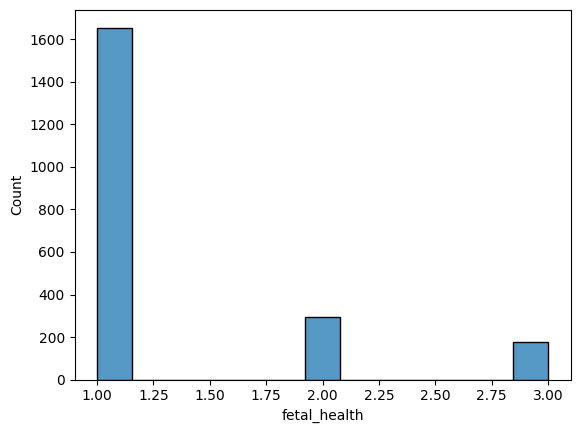

In [ ]:
df = sns.histplot(fetal_data['fetal_health'])
# Checking the distribution of the data using a histplot
# We can see that the data observations are skewed. This means that we have to handle the class imbalance in the data during the split.


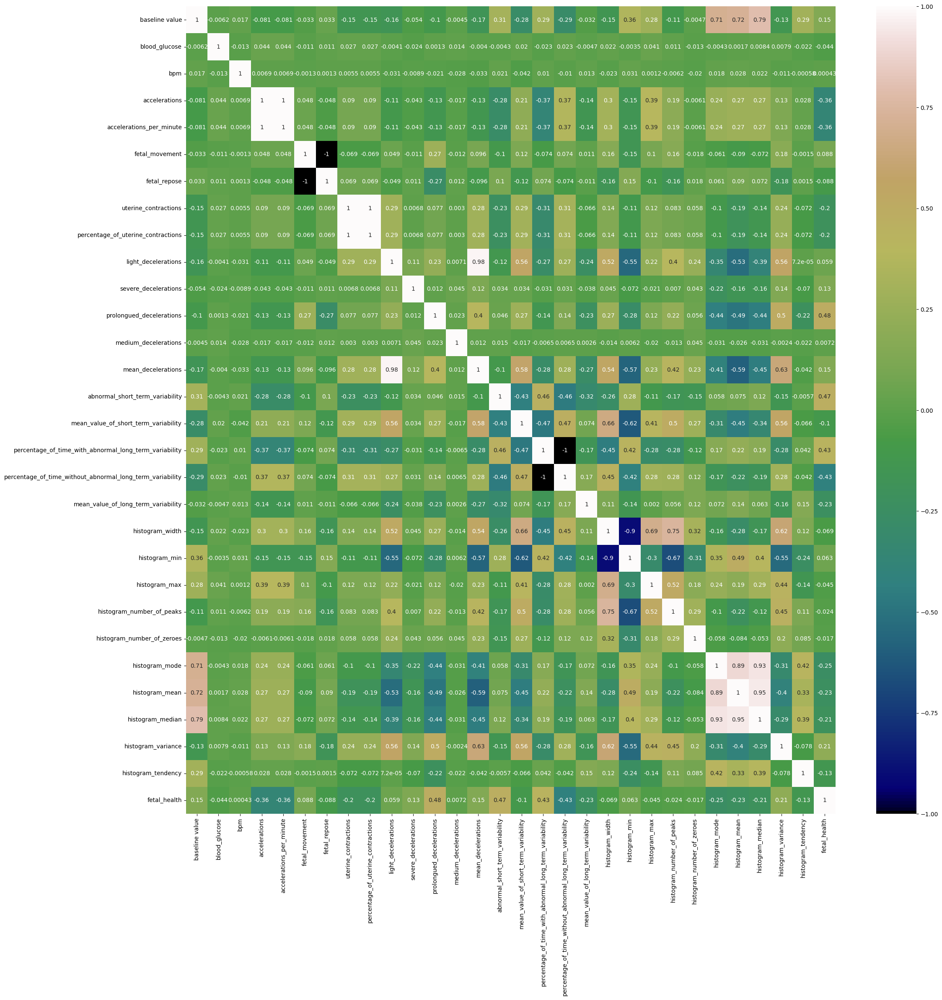

In [ ]:
corr = fetal_data.corr()

plt.figure(figsize=(25,25))
sns.heatmap(corr, annot=True, cmap='gist_earth')
plt.show()
# Checking to see if data is linearly dependent. If the data is linearly dependent,
#we can apply PCA technique for dimensionality reduction. We see that many variables are linearly dependent
# Thus, we can apply PCA

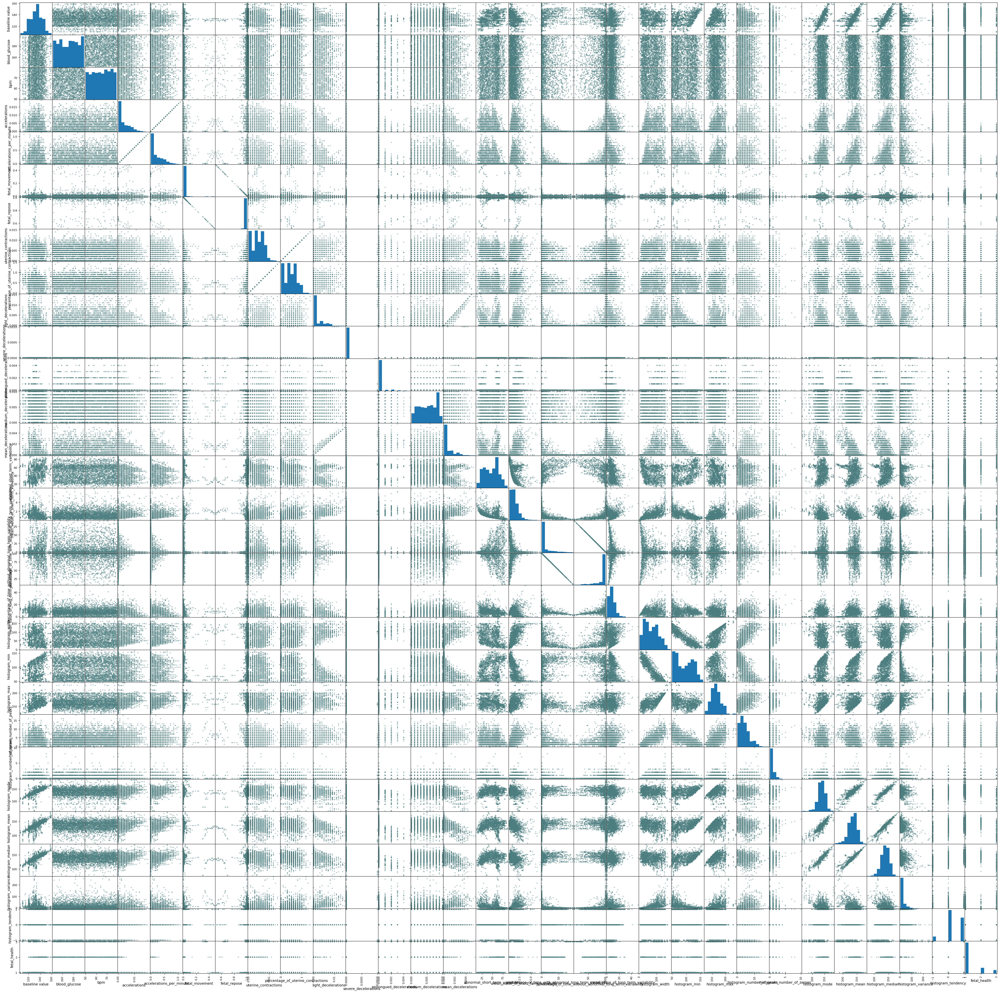

In [ ]:
from pandas.plotting import scatter_matrix
scatterMatrix = scatter_matrix(fetal_data,figsize=(50, 50), color = "#4c7e80")
# Plotting the Scatter matrix to further visualize the dependence of data.

In [ ]:
# creating the variables for the training and testing purpose
y=fetal_data.fetal_health
x=fetal_data.drop(["fetal_health"],axis=1)

In [ ]:
x_train, x_test, y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=0)

In [ ]:
from imblearn.over_sampling import SMOTE

# Define SMOTE
smote = SMOTE(sampling_strategy='auto')  # 'auto' will balance class distribution

# Apply SMOTE
x_train_s, y_train_s = smote.fit_resample(x_train, y_train)


In [ ]:
from collections import Counter

# Assuming y_train_smote is your target variable after applying SMOTE
class_distribution = Counter(y_train_s)
print("Class distribution:", class_distribution)


Class distribution: Counter({1.0: 1329, 2.0: 1329, 3.0: 1329})


In [ ]:
# Before SMOTE
original_distribution = Counter(y_train)
print("Original class distribution:", original_distribution)

# After SMOTE
print("Class distribution after SMOTE:", class_distribution)



Original class distribution: Counter({1.0: 1329, 2.0: 237, 3.0: 134})
Class distribution after SMOTE: Counter({1.0: 1329, 2.0: 1329, 3.0: 1329})


### **OBSERVATIONS:**
-
-
-
-


# II. Tasks to do if Outlier Detection and Handling is Relevant to your Project

## Select your Outlier Detection and Handling Methods:

Outliers are the values that deviate significantly from the rest of the data in a dataset. Detecting and handling outliers is important in data preprocessing to ensure that they do not unduly influence the results of statistical analyses or machine learning models. Here are some common methods for outlier detection and handling:

Outlier Detection
1. Descriptive Statistics: Use basic descriptive statistics like mean, median, and standard deviation to identify potential outliers. Values that fall far from the mean or median may be considered outliers.
2. Z-Score: Calculate the Z-score for each value. Z-score measures how many standard deviations a value is from the mean. Points with high absolute Z-scores may be considered outliers.
3. Density-Based Methods: Algorithms like DBSCAN (Density-Based Spatial Clustering of Applications with Noise) can identify outliers based on the density of values. Outliers are often isolated points with low local density.
4. Distance-based Methods: Use distance-based methods like k-Nearest Neighbors (KNN) to identify outliers based on the distance to their neighbors. Values with unusually large distances may be considered outliers.
5. Machine Learning Models: Train machine learning models (e.g., one-class SVM) to identify instances that deviate from the norm. These models are trained on "normal" instances and can detect anomalies.

Outlier Handling
1. Removing Outliers: Remove identified outliers from the dataset. However, this should be done cautiously, as removing too many outliers might lead to a loss of valuable information.
2. Transformations: Apply data transformations such as log transformations to reduce the impact of outliers. This can help stabilize variance and make the data more amenable to analysis.
3. Imputation: For missing values caused by outliers, impute values based on a strategy like mean, median, or regression imputation. This helps maintain data completeness.
4. Winsorizing: Set a threshold for extreme values, and replace data points beyond this threshold with the threshold values. This helps mitigate the impact of extreme outliers.
5. Robust Regression: Use robust regression techniques that are less sensitive to outliers. Methods like Huber regression or Theil-Sen regression can be employed.
6. Clipping: Clip extreme values by setting a minimum and maximum threshold for values. Values beyond these thresholds are capped at the threshold values.
7. Feature Engineering: Create new features that capture information differently or aggregate extreme values in a more meaningful way.
    
When handling outliers, it's essential to consider the nature of your data and the goals of your analysis or modeling. It's often a good practice to explore the impact of outlier handling methods on the overall results and choose the approach that best suits your specific use case.

Choose appropriate Outlier detection and handling methods. List the methods that you will use providing a short derscription of each.

## Apply Outlier Detection and Handling Methods:

Implement the Outlier Detection and Handling methods on the training data.

## Show your revised Data after removing Outliers:

Show your revised data comparing to original data

# III. Tasks to do if Dealing with non-uniform data is Relevant to your Project

## Select your non-uniform data dealing Methods:

Dealing with non-uniform data is a common challenge in various fields, including data science, machine learning, and statistics. Non-uniform data refers to datasets where the distribution of values is not consistent, and some parts of the data may be more or less prevalent than others. Here are some strategies to handle non-uniform data:

1. Understand the Data Distribution: Analyze the distribution of your data. Use visualizations such as histograms or kernel density plots to understand the frequency and spread of different values.
2. Data Resampling: If one class is underrepresented, you can balance the dataset through oversampling the minority class or undersampling the majority class. However, be cautious as oversampling can lead to overfitting, and undersampling may result in information loss.
4. Weighted Loss Functions: Adjust the loss function to give more importance to the underrepresented class. This can be done by assigning higher weights to the minority class in binary or multi-class classification problems.
5. Ensemble Methods: Combine predictions from multiple models using ensemble techniques. This can sometimes improve performance, especially when different models capture different aspects of the data distribution.
6. Anomaly Detection: Treat the underrepresented class as an anomaly and use anomaly detection techniques to identify instances of that class. This approach is useful when dealing with imbalanced datasets where the minority class is of particular interest.
7. Transfer Learning: Use pre-trained models on related tasks or domains and fine-tune them on your non-uniform data. Transfer learning can help leverage knowledge gained from a larger, more diverse dataset.

Synthetic Data Generation and Feature Engineering are possible for non-uniform data, but those will be handled by other chapters(Data Argumentation and Handling, and Feature Selection/Extraction.
Choose appropriate dealing methods with non-uniform data based on the nature of the data and the problem at hand.
List the methods that you will use providing a short derscription of each.


## Apply Dealing Methods with non-uniform data:

Implement the dealing methods with non-uniform data.

## Show your revised Data:

Show your revised data comparing to original data

# IV. Tasks to do if Data Preprocessing is Relevant to your Project

## **Choose Your Data Preprocessing Methods:**

Numeric values(or features) in original data can be preprocessed by the methods below. One or more methods can be selected.
1. Standardization: This method involves transforming each value by subtracting the mean and dividing by the standard deviation of the dataset, thus achieving a zero mean and unit variance, commonly termed Z-score normalization.
2. Min-Max Normalization: This method rescales each value by subtracting the minimum value and dividing by the range of the dataset, thereby transforming the data to fit within a specified range, typically 0 to 1.
3. Mean Normalization: Similar to standardization, this method adjusts values to have a zero mean by subtracting the mean and dividing by the range, without altering the standard deviation.
4. Unit Vector Normalization: This approach normalizes data by dividing each value by its vector magnitude, resulting in a dataset where each value has a unit length.

Codes in original data can be preprocessed by the below. However the encoded values should be handled separatedly comparing to numeric values.
- Encode categorical variables using methods like one-hot encoding or label encoding.

Others are considered as below.
- Handle missing data by imputing or removing null values.

Choose appropriate preprocessing methods considering the type of the values. List the methods that you will use providing a short derscription of each.

## Apply your Data Preprocessing Methods:

Implement the chosen preprocessing method on the original data.

## Show your Preprocssed Data:

Show your preprocessed data comparing to the original data

# V. Preparation of Learning Data

## Split the Data:
Divide the dataset into learning, training and testing datasets.

# VI. Tasks to do if Data Augmentation is Relevant to your Project

## Select your Data Augmentation Methods:

There are the diverse kinds of Data Augmentation methods. The below are some methods that you might utilize.
1. Feature Crossing: This method combines multiple features to form a new composite feature, facilitating the capture of complex interactions between variables that may be predictive of outcomes.
2. Polynomial Features: This method entails generating additional features by elevating existing features to various powers and creating interaction terms, enhancing the model's ability to discern intricate patterns in the data.
3. Sample Interpolation: This method produces new data points by interpolating between existing samples, thus enriching the dataset with a broader spectrum of variations and nuances.
4. Adding Noise: This process introduces stochastic variations to the data, aiding in the development of more resilient models by reducing the likelihood of overfitting to the training dataset.
5. Random Sampling with Replacement: This method involves creating augmented datasets by randomly selecting and potentially reselecting samples from the original dataset, thereby amplifying the heterogeneity and representativeness of the training data.

Choose appropriate Data Augmentation methods based on the nature of the data and the problem at hand.
List the methods that you will use providing a short derscription of each.

## Apply Data Augmentation Methods:

Implement the Data Augmentation methods.

## Show your Augmented Data:

Show your generated new data comparing to original data

# VII. Tasks to do if Feature Selection is Relevant to your Project

## Choose Your Feature Selection Methods:

There are various feature selection methods, and the choice depends on the dataset and the problem. Common techniques include:
    
- Filter Methods: Evaluate features based on statistical measures, such as correlation, information gain, or chi-square.
- Wrapper Methods: Use a specific machine learning algorithm to evaluate subsets of features based on their impact on model performance.
- Embedded Methods: Feature selection is integrated into the model training process, as seen in regularization techniques.
        
List the methods you will use providing a short derscription of each.

## Apply Feature Selection Methods:

Implement the chosen feature selection methods on the training data. This involves ranking or scoring features based on their relevance to the target variable.


In [ ]:
import pandas as pd
from sklearn.datasets import make_classification
import seaborn as sns
import matplotlib.pyplot as plt

fetal_data_new = fetal_data.copy()

# Calculate the correlation matrix
corr_matrix = fetal_data_new.corr()

# Selecting highly correlated features
threshold = 0.8
corr_features = set()
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) > threshold:
            colname = corr_matrix.columns[i]
            corr_features.add(colname)

# Removing the highly correlated features
fetal_data_new.drop(labels=corr_features, axis=1, inplace=True)

# Remaining dataset
print(fetal_data_new.head())


   baseline value  blood_glucose  bpm  accelerations  fetal_movement  \
0           120.0            189   64          0.000             0.0   
1           132.0            172   50          0.006             0.0   
2           133.0            159   62          0.003             0.0   
3           134.0            148   62          0.003             0.0   
4           132.0            197   74          0.007             0.0   

   uterine_contractions  light_decelerations  severe_decelerations  \
0                 0.000                0.000                   0.0   
1                 0.006                0.003                   0.0   
2                 0.008                0.003                   0.0   
3                 0.008                0.003                   0.0   
4                 0.008                0.000                   0.0   

   prolongued_decelerations  medium_decelerations  ...  \
0                       0.0                 0.001  ...   
1                       0.0   

Removing highly correlated features in the Filter Method using Pearson Correlation is an essential step in feature selection. When two features are highly correlated, they carry similar information about the variance within the dataset. This means one of the features will be redundant since the information it provides is already captured by the other feature. By removing these redundant features, we can reduce the complexity of the model without a significant loss of information.
Highly correlated features can lead to issues like multicollinearity in linear models, where it becomes difficult to estimate the relationship between each independent variable and the dependent variable accurately. This can negatively impact the model's performance. By removing these features, we can often improve the model's accuracy and interpretability.

In [ ]:
corr_features

{'accelerations_per_minute',
 'fetal_repose',
 'histogram_mean',
 'histogram_median',
 'histogram_min',
 'mean_decelerations',
 'percentage_of_time_without_abnormal_long_term_variability',
 'percentage_of_uterine_contractions'}

In [ ]:
import pandas as pd
from sklearn.linear_model import LassoCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Assuming fetal_data_new is your DataFrame and it has a target variable column named 'target'
# Replace 'target' with the actual name of your target variable column

# Separate features and target
fetal_data_new = fetal_data.copy()
X1 = fetal_data_new.drop('fetal_health', axis=1)
y1 = fetal_data_new['fetal_health']

# It's a good practice to scale features when using regularization techniques
scaler = StandardScaler()
X1_scaled = scaler.fit_transform(X1)

# Splitting the data into training and test sets
X1_train, X1_test, y1_train, y1_test = train_test_split(X1_scaled, y1, test_size=0.3, random_state=42)

# LASSO regression for feature selection
lasso = LassoCV(cv=5, random_state=42).fit(X1_train, y1_train)

# Getting the coefficients
coef = pd.Series(lasso.coef_, index = X1.columns)

# Print out the selected features and their coefficients
print("The features picked by Lasso Algorithm")
print(coef[coef != 0])

The features picked by Lasso Algorithm
baseline value                                               1.683688e-01
blood_glucose                                               -1.392240e-02
bpm                                                          6.472911e-03
accelerations                                               -9.321282e-03
accelerations_per_minute                                    -2.830935e-16
fetal_movement                                               8.850874e-03
uterine_contractions                                        -6.901524e-02
light_decelerations                                         -3.598230e-02
severe_decelerations                                         3.797251e-02
prolongued_decelerations                                     1.897954e-01
medium_decelerations                                        -1.428254e-02
abnormal_short_term_variability                              1.509687e-01
mean_value_of_short_term_variability                         1.015825e-02

## Evaluate Models Performance:

Train your machine learning models using the selected features and evaluate their performance on the testing set. Measure metrics such as accuracy, precision, recall, and F1 score.

## Compare Models Performance:

Provide a comparative analysis of the relative performance of the used models.

# VIII. Tasks to do if Feature Extraction is Relevant to your Project

## Select your Feature Extraction Methods:

Choose appropriate feature extraction techniques based on the nature of the data and the problem at hand. Common techniques include:
- Principal Component Analysis (PCA): Reduces dimensionality by transforming the data into a new set of uncorrelated variables (principal components).
- Linear Discriminant Analysis (LDA): Maximizes the separation between different classes in the data.
- t-Distributed Stochastic Neighbor Embedding (t-SNE): Visualizes high-dimensional data in a lower-dimensional space, preserving local relationships, and
- Autoencoders: Neural network-based methods for learning data representations.

List the methods you will use providing a short derscription of each.

Principal Component Analysis(PCA) : Before applying PCA, we have to make sure that the data is linearly dependent. To do this, we
have taken a coorelation matrix and showed the linear dependency of the features. Once we are satisfied with the linear dependency of the features,
we perform the scaling of the data. We use StandardScalar to make sure that mean of the data is 0 and the standard deviation of the data is 1. Then,
we perform the PCA till 95% of the variance of the data is explained by the selected principal components. Those principal components are selected for the model trainnig.

Linear Discriminant Analysis(LDA): This method of feature extraction and dimensionality reduction focuses on finding linear combination of features that best seperate
the three classes in a supervised manner. Even for this method of feature extraction, we use the StandardScaler as above. We perform the LDA using predefined methods
in Scikitlearn.

Before Feature Scaling(Training the Machine Learning models without feature extraction techniques and testing them)

In [ ]:
# K Nearest Neighbors
model = KNeighborsClassifier()
model.fit(x_train_s,y_train_s)
model.score(x_test,y_test )

0.8262910798122066

In [ ]:
pred = model.predict(x_test)

print("\naccuracy score:%f"%(accuracy_score(y_test,pred)*100))


accuracy score:82.629108


In [ ]:
print("Classification Report")
print(classification_report(y_test, pred))

Classification Report
              precision    recall  f1-score   support

         1.0       0.95      0.84      0.89       326
         2.0       0.45      0.74      0.56        58
         3.0       0.81      0.83      0.82        42

    accuracy                           0.83       426
   macro avg       0.74      0.81      0.76       426
weighted avg       0.87      0.83      0.84       426



In [ ]:
#Random Forest Classifier
model = RandomForestClassifier()
model.fit(x_train_s,y_train_s)
model.score(x_test,y_test )

0.9248826291079812

In [ ]:
pred = model.predict(x_test)
print("\naccuracy score:%f"%(accuracy_score(y_test,pred)*100))


accuracy score:92.488263


In [ ]:
print("Classification Report")
print(classification_report(y_test, pred))

Classification Report
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       326
         2.0       0.75      0.76      0.75        58
         3.0       0.90      0.90      0.90        42

    accuracy                           0.92       426
   macro avg       0.87      0.87      0.87       426
weighted avg       0.93      0.92      0.93       426



In [ ]:
#Gradient Boosting Classifier
gbc = GradientBoostingClassifier()
gbc.fit(x_train_s,y_train_s)
gbc.score(x_test,y_test )

0.9436619718309859

In [ ]:
pred = model.predict(x_test)
print("\naccuracy score:%f"%(accuracy_score(y_test,pred)*100))


accuracy score:92.488263


In [ ]:
print("Classification Report")
print(classification_report(y_test, pred))

Classification Report
              precision    recall  f1-score   support

         1.0       0.96      0.96      0.96       326
         2.0       0.75      0.76      0.75        58
         3.0       0.90      0.90      0.90        42

    accuracy                           0.92       426
   macro avg       0.87      0.87      0.87       426
weighted avg       0.93      0.92      0.93       426



In [ ]:
#decision tree classifier
model = DecisionTreeClassifier()
model.fit(x_train_s,y_train_s)
model.score(x_test,y_test )

0.9178403755868545

In [ ]:
pred = model.predict(x_test)
print("\naccuracy score:%f"%(accuracy_score(y_test,pred)*100))


accuracy score:91.784038


In [ ]:
print("Classification Report")
print(classification_report(y_test, pred))

Classification Report
              precision    recall  f1-score   support

         1.0       0.96      0.94      0.95       326
         2.0       0.71      0.78      0.74        58
         3.0       0.91      0.93      0.92        42

    accuracy                           0.92       426
   macro avg       0.86      0.88      0.87       426
weighted avg       0.92      0.92      0.92       426



In [ ]:

model = GaussianNB()
model.fit(x_train_s, y_train_s)
model.score(x_test, y_test)

0.7723004694835681

In [ ]:
pred = model.predict(x_test)
print("\naccuracy score:%f"%(accuracy_score(y_test,pred)*100))


accuracy score:77.230047


In [ ]:
print("Classification Report")
print(classification_report(y_test, pred))

Classification Report
              precision    recall  f1-score   support

         1.0       0.97      0.78      0.86       326
         2.0       0.45      0.84      0.58        58
         3.0       0.50      0.64      0.56        42

    accuracy                           0.77       426
   macro avg       0.64      0.75      0.67       426
weighted avg       0.85      0.77      0.79       426



In [ ]:

model = LogisticRegression()
model.fit(x_train_s, y_train_s)
model.score(x_test, y_test)

0.7934272300469484

In [ ]:
pred = model.predict(x_test)
print("\naccuracy score:%f"%(accuracy_score(y_test,pred)*100))


accuracy score:79.342723


In [ ]:
print("Classification Report")
print(classification_report(y_test, pred))

Classification Report
              precision    recall  f1-score   support

         1.0       0.96      0.80      0.87       326
         2.0       0.42      0.72      0.54        58
         3.0       0.64      0.81      0.72        42

    accuracy                           0.79       426
   macro avg       0.67      0.78      0.71       426
weighted avg       0.85      0.79      0.81       426



In [ ]:
model = LinearDiscriminantAnalysis()
model.fit(x_train_s, y_train_s)
model.score(x_test, y_test)

0.812206572769953

In [ ]:
pred = model.predict(x_test)
print("\naccuracy score:%f"%(accuracy_score(y_test,pred)*100))


accuracy score:81.220657


In [ ]:
print("Classification Report")
print(classification_report(y_test, pred))

Classification Report
              precision    recall  f1-score   support

         1.0       0.97      0.81      0.88       326
         2.0       0.45      0.84      0.58        58
         3.0       0.73      0.79      0.76        42

    accuracy                           0.81       426
   macro avg       0.72      0.81      0.74       426
weighted avg       0.88      0.81      0.83       426



In [ ]:
models = []
models.append(('GB', GradientBoostingClassifier()))
models.append(('RF', RandomForestClassifier()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('DT', DecisionTreeClassifier()))
models.append(('GNB', GaussianNB()))
models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))

names = []
scores = []
for name, model in models:
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    scores.append(accuracy_score(y_test, y_pred))
    names.append(name)
model_list = pd.DataFrame({'Name': names, 'Score': scores})
print(model_list)

  Name     Score
0   GB  0.943662
1   RF  0.936620
2  KNN  0.849765
3   DT  0.910798
4  GNB  0.800469
5   LR  0.861502
6  LDA  0.868545


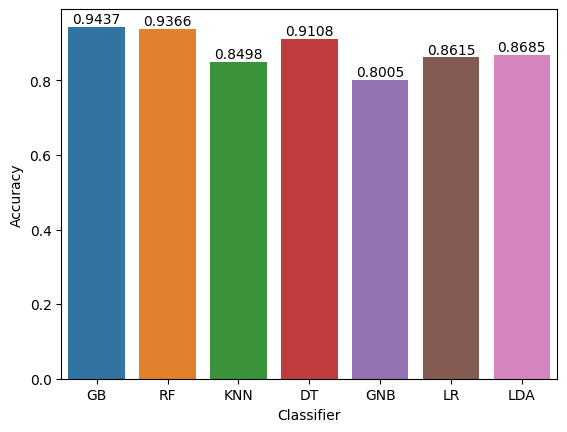

In [ ]:
axis = sns.barplot(x = 'Name', y = 'Score', data =model_list)
axis.set(xlabel='Classifier', ylabel='Accuracy')
for p in axis.patches:
    height = p.get_height()
    axis.text(p.get_x() + p.get_width()/2, height + 0.01, '{:1.4f}'.format(height), ha="center")

plt.show()

## Feature Scaling:

Before you apply the chosen methods, you may need to normalize or scale features as needed (especially when using techniques like PCA or neural networks).

In [ ]:
# Scaling the data since that is important for the PCA to be performed

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(x_train_s)
X_test_scaled = scaler.transform(x_test)

## Apply your Feature Extraction Methods:

Implement the chosen feature extraction method on the dataset to obtain a reduced set of features or transformed representations.

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=16)
x_train_pca = pca.fit_transform(X_train_scaled)
x_test_pca = pca.transform(X_test_scaled)

In [ ]:
x_train_pca.shape

(3987, 16)

In [ ]:
cumsum = np.cumsum(pca.explained_variance_ratio_)
print (cumsum)
d=np.argmax(cumsum>=0.95)+1

[0.33915572 0.46652552 0.54496088 0.60381414 0.65622163 0.70308013
 0.74175571 0.77771525 0.81304271 0.84653394 0.87648776 0.90158386
 0.923368   0.94075189 0.95560612 0.96853707]


In [ ]:
# Now, perform feature selection on the PCA-transformed data
# You can use SelectKBest with an appropriate score function, e.g., f_classif
kbest = SelectKBest(score_func=f_classif, k=16)  # Select the top 16 features

# Create a pipeline to combine PCA and feature selection
pipeline = Pipeline([('pca', pca), ('kbest', kbest)])

# Fit the pipeline to your data and transform it
x_selected = pipeline.fit_transform(x, y)

# Get the selected feature indices
selected_feature_indices = kbest.get_support(indices=True)

# Get the names of the selected features from the original dataset
selected_feature_names = x.columns[selected_feature_indices]

# Print the names of the selected features
print("Selected Feature Names:")
for name in selected_feature_names:
    print(name)

Selected Feature Names:
baseline value
blood_glucose
bpm
accelerations
accelerations_per_minute
fetal_movement
fetal_repose
uterine_contractions
percentage_of_uterine_contractions
light_decelerations
severe_decelerations
prolongued_decelerations
medium_decelerations
mean_decelerations
abnormal_short_term_variability
mean_value_of_short_term_variability


## Evaluate Results and Potentially Reiterate the Process:

Assess the effectiveness of the feature extraction processes. This may involve checking the variance, visualizing data in the reduced feature space, or evaluating the impact on model performance.

If model performance is not satisfactory, iterate on the feature extraction process by adjusting parameters or trying different methods.

You may also consider incorporating Domain Knowledge to guide the feature extraction process. Understanding the context of the data, therefore, can be helpful in selecting meaningful features.

In [ ]:
#kNN Classifier
model = KNeighborsClassifier()
model.fit(x_train_pca,y_train_s)
model.score(x_test_pca,y_test )

0.8356807511737089

In [ ]:
pred = model.predict(x_test_pca)
print("\naccuracy score:%f"%(accuracy_score(y_test,pred)*100))


accuracy score:83.568075


In [ ]:
print("Classification Report")
print(classification_report(y_test, pred))

Classification Report
              precision    recall  f1-score   support

         1.0       0.97      0.85      0.91       326
         2.0       0.45      0.74      0.56        58
         3.0       0.80      0.86      0.83        42

    accuracy                           0.84       426
   macro avg       0.74      0.82      0.76       426
weighted avg       0.88      0.84      0.85       426



In [ ]:
#Random Forest Classifier
model = RandomForestClassifier()
model.fit(x_train_pca,y_train_s)
model.score(x_test_pca,y_test )

0.8873239436619719

In [ ]:
pred = model.predict(x_test_pca)
print("\naccuracy score:%f"%(accuracy_score(y_test,pred)*100))


accuracy score:88.732394


In [ ]:
print("Classification Report")
print(classification_report(y_test, pred))

Classification Report
              precision    recall  f1-score   support

         1.0       0.95      0.93      0.94       326
         2.0       0.60      0.69      0.64        58
         3.0       0.90      0.83      0.86        42

    accuracy                           0.89       426
   macro avg       0.81      0.82      0.81       426
weighted avg       0.89      0.89      0.89       426



In [ ]:
#Gradient Boosting Classifier
gbc = GradientBoostingClassifier()
gbc.fit(x_train_pca,y_train_s)
gbc.score(x_test_pca,y_test )

0.8732394366197183

In [ ]:
pred = model.predict(x_test_pca)
print("\naccuracy score:%f"%(accuracy_score(y_test,pred)*100))


accuracy score:88.732394


In [ ]:
print("Classification Report")
print(classification_report(y_test, pred))

Classification Report
              precision    recall  f1-score   support

         1.0       0.95      0.93      0.94       326
         2.0       0.60      0.69      0.64        58
         3.0       0.90      0.83      0.86        42

    accuracy                           0.89       426
   macro avg       0.81      0.82      0.81       426
weighted avg       0.89      0.89      0.89       426



In [ ]:
#decision tree classifier
model = DecisionTreeClassifier()
model.fit(x_train_pca,y_train_s)
model.score(x_test_pca,y_test )

0.8497652582159625

In [ ]:
pred = model.predict(x_test_pca)
print("\naccuracy score:%f"%(accuracy_score(y_test,pred)*100))


accuracy score:84.976526


In [ ]:
print("Classification Report")
print(classification_report(y_test, pred))

Classification Report
              precision    recall  f1-score   support

         1.0       0.93      0.89      0.91       326
         2.0       0.56      0.69      0.62        58
         3.0       0.74      0.74      0.74        42

    accuracy                           0.85       426
   macro avg       0.74      0.77      0.76       426
weighted avg       0.86      0.85      0.85       426



In [ ]:
# Gaussian Naive Bayes
model = GaussianNB()
model.fit(x_train_pca, y_train_s)
model.score(x_test_pca,y_test)

0.7605633802816901

In [ ]:
pred = model.predict(x_test_pca)
print("\naccuracy score:%f"%(accuracy_score(y_test,pred)*100))


accuracy score:76.056338


In [ ]:
print("Classification Report")
print(classification_report(y_test, pred))

Classification Report
              precision    recall  f1-score   support

         1.0       0.96      0.76      0.85       326
         2.0       0.40      0.76      0.52        58
         3.0       0.56      0.76      0.65        42

    accuracy                           0.76       426
   macro avg       0.64      0.76      0.67       426
weighted avg       0.84      0.76      0.78       426



In [ ]:
# Logistic Regression
model = LogisticRegression()
model.fit(x_train_pca, y_train_s)
model.score(x_test_pca,y_test)


0.8403755868544601

In [ ]:
pred = model.predict(x_test_pca)
print("\naccuracy score:%f"%(accuracy_score(y_test,pred)*100))


accuracy score:84.037559


In [ ]:
print("Classification Report")
print(classification_report(y_test, pred))

Classification Report
              precision    recall  f1-score   support

         1.0       0.97      0.85      0.91       326
         2.0       0.51      0.79      0.62        58
         3.0       0.71      0.81      0.76        42

    accuracy                           0.84       426
   macro avg       0.73      0.82      0.76       426
weighted avg       0.88      0.84      0.85       426



In [ ]:
model = LinearDiscriminantAnalysis()
model.fit(x_train_pca, y_train_s)
model.score(x_test_pca, y_test)

0.7981220657276995

In [ ]:
pred = model.predict(x_test_pca)
print("\naccuracy score:%f"%(accuracy_score(y_test,pred)*100))


accuracy score:79.812207


In [ ]:
print("Classification Report")
print(classification_report(y_test, pred))

Classification Report
              precision    recall  f1-score   support

         1.0       0.96      0.80      0.87       326
         2.0       0.45      0.81      0.58        58
         3.0       0.63      0.76      0.69        42

    accuracy                           0.80       426
   macro avg       0.68      0.79      0.71       426
weighted avg       0.86      0.80      0.82       426



In [ ]:
models = []
models.append(('GB', GradientBoostingClassifier()))
models.append(('RF', RandomForestClassifier()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('DT', DecisionTreeClassifier()))
models.append(('GNB', GaussianNB()))
models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))

names = []
scores = []
for name, model in models:
    model.fit(x_train_pca, y_train_s)
    y_pred = model.predict(x_test_pca)
    scores.append(accuracy_score(y_test, y_pred))
    names.append(name)
model_list = pd.DataFrame({'Name': names, 'Score': scores})
print(model_list)

  Name     Score
0   GB  0.873239
1   RF  0.877934
2  KNN  0.835681
3   DT  0.849765
4  GNB  0.760563
5   LR  0.840376
6  LDA  0.798122


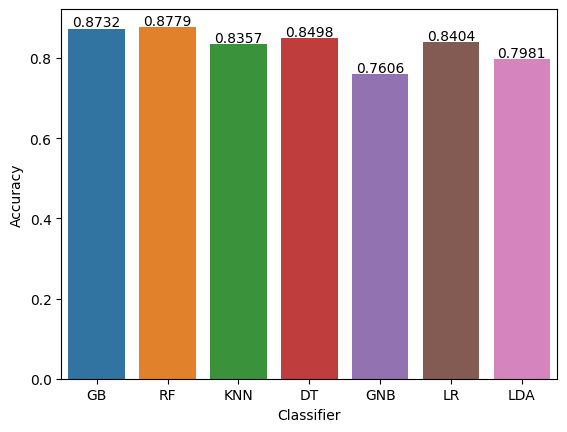

In [ ]:
axis = sns.barplot(x = 'Name', y = 'Score', data =model_list )
axis.set(xlabel='Classifier', ylabel='Accuracy')
for p in axis.patches:
    height = p.get_height()
    axis.text(p.get_x() + p.get_width()/2, height + 0.005, '{:1.4f}'.format(height), ha="center")

plt.show()

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Assuming X and y are your features and labels


# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(x_train_s)
X_test_scaled = scaler.transform(x_test)

# Apply LDA
lda = LinearDiscriminantAnalysis(n_components=None)  # n_components can be set to None or less than the number of classes - 1
x_train_lda = lda.fit_transform(X_train_scaled, y_train_s)
x_test_lda = lda.transform(X_test_scaled)

# X_train_lda and X_test_lda are now your features reduced by LDA, ready for model training


In [ ]:
#kNN Classifier
model = KNeighborsClassifier()
model.fit(x_train_lda,y_train_s)
model.score(x_test_lda,y_test )

0.8427230046948356

In [ ]:
pred = model.predict(x_test_lda)
print("\naccuracy score:%f"%(accuracy_score(y_test,pred)*100))


accuracy score:84.272300


In [ ]:
print("Classification Report")
print(classification_report(y_test, pred))

Classification Report
              precision    recall  f1-score   support

         1.0       0.95      0.87      0.91       326
         2.0       0.50      0.71      0.59        58
         3.0       0.74      0.81      0.77        42

    accuracy                           0.84       426
   macro avg       0.73      0.80      0.76       426
weighted avg       0.87      0.84      0.85       426



In [ ]:
#Random Forest Classifier
model = RandomForestClassifier()
model.fit(x_train_lda,y_train_s)
model.score(x_test_lda,y_test )

0.8568075117370892

In [ ]:
pred = model.predict(x_test_lda)
print("\naccuracy score:%f"%(accuracy_score(y_test,pred)*100))


accuracy score:85.680751


In [ ]:
print("Classification Report")
print(classification_report(y_test, pred))

Classification Report
              precision    recall  f1-score   support

         1.0       0.96      0.87      0.92       326
         2.0       0.55      0.83      0.66        58
         3.0       0.76      0.76      0.76        42

    accuracy                           0.86       426
   macro avg       0.76      0.82      0.78       426
weighted avg       0.89      0.86      0.87       426



In [ ]:
#Gradient Boosting Classifier
gbc = GradientBoostingClassifier()
gbc.fit(x_train_lda,y_train_s)
gbc.score(x_test_lda,y_test )

0.863849765258216

In [ ]:
pred = model.predict(x_test_lda)
print("\naccuracy score:%f"%(accuracy_score(y_test,pred)*100))


accuracy score:85.680751


In [ ]:
print("Classification Report")
print(classification_report(y_test, pred))

Classification Report
              precision    recall  f1-score   support

         1.0       0.96      0.87      0.92       326
         2.0       0.55      0.83      0.66        58
         3.0       0.76      0.76      0.76        42

    accuracy                           0.86       426
   macro avg       0.76      0.82      0.78       426
weighted avg       0.89      0.86      0.87       426



In [ ]:
#decision tree classifier
model = DecisionTreeClassifier()
model.fit(x_train_lda,y_train_s)
model.score(x_test_lda,y_test )

0.8568075117370892

In [ ]:
pred = model.predict(x_test_lda)
print("\naccuracy score:%f"%(accuracy_score(y_test,pred)*100))


accuracy score:85.680751


In [ ]:
print("Classification Report")
print(classification_report(y_test, pred))

Classification Report
              precision    recall  f1-score   support

         1.0       0.96      0.89      0.92       326
         2.0       0.53      0.74      0.62        58
         3.0       0.73      0.79      0.76        42

    accuracy                           0.86       426
   macro avg       0.74      0.80      0.77       426
weighted avg       0.88      0.86      0.87       426



In [ ]:
# Gaussian Naive Bayes
model = GaussianNB()
model.fit(x_train_lda, y_train_s)
model.score(x_test_lda,y_test)


0.8215962441314554

In [ ]:
pred = model.predict(x_test_lda)
print("\naccuracy score:%f"%(accuracy_score(y_test,pred)*100))


accuracy score:82.159624


In [ ]:
print("Classification Report")
print(classification_report(y_test, pred))

Classification Report
              precision    recall  f1-score   support

         1.0       0.96      0.83      0.89       326
         2.0       0.47      0.81      0.59        58
         3.0       0.73      0.79      0.76        42

    accuracy                           0.82       426
   macro avg       0.72      0.81      0.75       426
weighted avg       0.87      0.82      0.84       426



In [ ]:
# Logistic Regression
model = LogisticRegression()
model.fit(x_train_lda, y_train_s)
model.score(x_test_lda,y_test)


0.8309859154929577

In [ ]:
pred = model.predict(x_test_lda)
print("\naccuracy score:%f"%(accuracy_score(y_test,pred)*100))


accuracy score:83.098592


In [ ]:
print("Classification Report")
print(classification_report(y_test, pred))

Classification Report
              precision    recall  f1-score   support

         1.0       0.96      0.85      0.90       326
         2.0       0.49      0.76      0.59        58
         3.0       0.71      0.76      0.74        42

    accuracy                           0.83       426
   macro avg       0.72      0.79      0.74       426
weighted avg       0.87      0.83      0.84       426



In [ ]:
models = []
models.append(('GB', GradientBoostingClassifier()))
models.append(('RF', RandomForestClassifier()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('DT', DecisionTreeClassifier()))
models.append(('GNB', GaussianNB()))
models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))

names = []
scores = []
for name, model in models:
    model.fit(x_train_lda, y_train_s)
    y_pred = model.predict(x_test_lda)
    scores.append(accuracy_score(y_test, y_pred))
    names.append(name)
model_list = pd.DataFrame({'Name': names, 'Score': scores})
print(model_list)

  Name     Score
0   GB  0.863850
1   RF  0.856808
2  KNN  0.842723
3   DT  0.856808
4  GNB  0.821596
5   LR  0.830986
6  LDA  0.812207


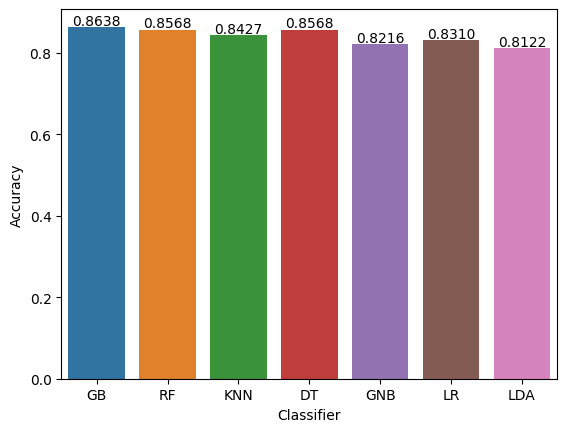

In [ ]:
axis = sns.barplot(x = 'Name', y = 'Score', data =model_list )
axis.set(xlabel='Classifier', ylabel='Accuracy')
for p in axis.patches:
    height = p.get_height()
    axis.text(p.get_x() + p.get_width()/2, height + 0.005, '{:1.4f}'.format(height), ha="center")

plt.show()

## Validate Your Results:

Validate the results on the above learning datast to ensure that the feature extraction choices generalize well.

In [ ]:
models = []
models.append(('GB', GradientBoostingClassifier()))
models.append(('RF', RandomForestClassifier()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('DT', DecisionTreeClassifier()))
models.append(('GNB', GaussianNB()))
models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))

names = []
scores = []
for name, model in models:
    model.fit(x_train_pca, y_train_s)
    y_pred = model.predict(x_test_pca)
    scores.append(accuracy_score(y_test, y_pred))
    names.append(name)
model_list = pd.DataFrame({'Name': names, 'Score': scores})
print(model_list)

  Name     Score
0   GB  0.873239
1   RF  0.889671
2  KNN  0.835681
3   DT  0.852113
4  GNB  0.760563
5   LR  0.840376
6  LDA  0.798122


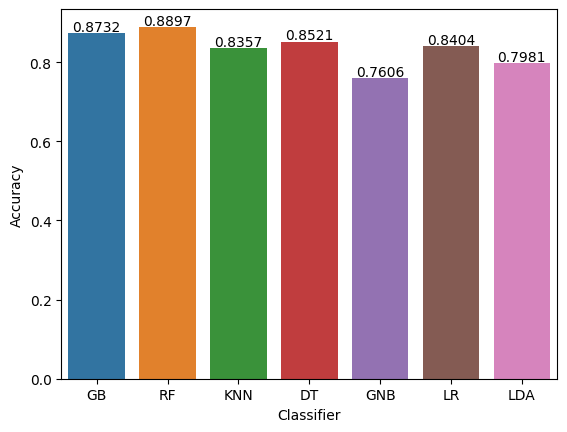

In [ ]:
axis = sns.barplot(x = 'Name', y = 'Score', data =model_list )
axis.set(xlabel='Classifier', ylabel='Accuracy')
for p in axis.patches:
    height = p.get_height()
    axis.text(p.get_x() + p.get_width()/2, height + 0.005, '{:1.4f}'.format(height), ha="center")

plt.show()

In [ ]:
models = []
models.append(('GB', GradientBoostingClassifier()))
models.append(('RF', RandomForestClassifier()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('DT', DecisionTreeClassifier()))
models.append(('GNB', GaussianNB()))
models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))

names = []
scores = []
for name, model in models:
    model.fit(x_train_pca, y_train_s)
    y_pred = model.predict(x_test_pca)
    scores.append(accuracy_score(y_test, y_pred))
    names.append(name)
model_list = pd.DataFrame({'Name': names, 'Score': scores})
print(model_list)

  Name     Score
0   GB  0.873239
1   RF  0.880282
2  KNN  0.835681
3   DT  0.847418
4  GNB  0.760563
5   LR  0.840376
6  LDA  0.798122


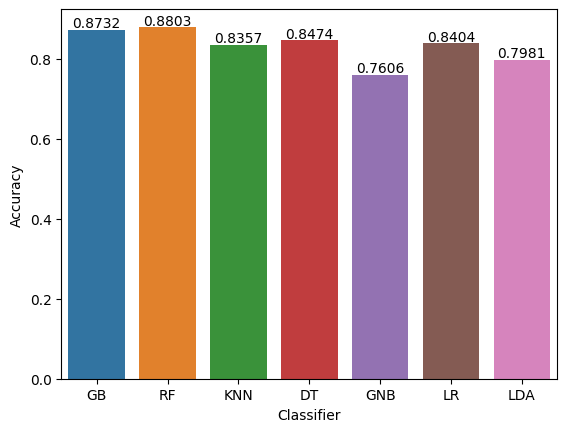

In [ ]:
axis = sns.barplot(x = 'Name', y = 'Score', data =model_list )
axis.set(xlabel='Classifier', ylabel='Accuracy')
for p in axis.patches:
    height = p.get_height()
    axis.text(p.get_x() + p.get_width()/2, height + 0.005, '{:1.4f}'.format(height), ha="center")

plt.show()

We showed the accuracy of different machine learning models after performing the feature extraction techinques. The accuracy of the machine learning models decreased slightly but the performance metrics like precision, recall, F1 score is better than that of the with all the features. This shows that the machine learning models after the feature extraction techniques have performed well and have generalised well to the data compared to the machine learning models being trained with all the features.

Show the effect of Outlier Detection and Handling methods in Data Augmentation with Feature Selection/Extraction if Outlier Detection and Handling is Relevant to your Project.


Show the effect of Dealing with non-uniform data in Data Augmentation with Feature Selection/Extraction if Dealing with non-uniform data is Relevant to your Project

Show the effect of Preprocessing dataset with Feature Selection/Extraction if Preprocessing dataset is Relevant to your Project

Show the effect of Data Argumentation with Feature Selection/Extraction if Data Argumentation is Relevant to your Project

## Compare Method Performance:

Provide a comparative analysis of the relative performance of the used feature extraction techniques.

# **IX. Conclusion and Final Recommendations**

Please describe how your methods showed better results than others considering your relevant methods.

In conclusion, we have performed feature selection and have eliminated some features using the coorelation threshold and the Lasso algorithm



```
We have also performed the feature extraction techniques and compared the performance of various machine learning models after the feature extraciton techniques have been performed and showed that the models are able to generalize well .
```

